<a href="https://colab.research.google.com/github/Ranggaalan/Hyperparameter-Optimization-Using-Proximal-Policy-Optimization-for-CNN-BiLSTM-MHAin-Sperm-Motility-/blob/main/ML_Lanjut_Sperm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#Import Package
from __future__ import division, unicode_literals, print_function  # for compatibility with Python 2 and 3
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas import DataFrame, Series
import pims
import trackpy as tp
import cv2
from PIL import Image
import scipy as sp
import imagecodecs as ic
from scipy import signal


In [3]:
import gymnasium as gym
from gymnasium import spaces

import numpy as np

from stable_baselines3 import PPO

from sklearn.metrics import (
    f1_score,
    roc_auc_score
)

import tensorflow as tf

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [4]:
import cv2
from PIL import Image

frames = []

for i in range(1, 11):

    video_path = f'video{i}.mp4'

    cap = cv2.VideoCapture(video_path)

    while cap.isOpened():
        ret, frame = cap.read()

        if not ret:
            break

        # BGR → RGB
        frame_rgb = cv2.cvtColor(
            frame,
            cv2.COLOR_BGR2RGB
        )

        img = Image.fromarray(frame_rgb)

        frames.append(img)

    cap.release()

print(f"Total frame seluruh video: {len(frames)}")

Total frame seluruh video: 2525


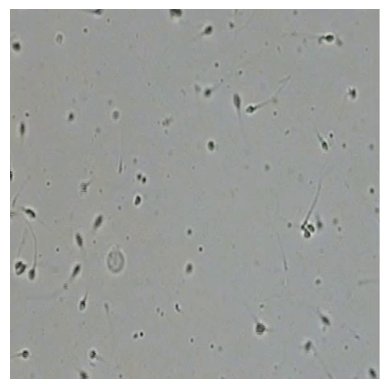

In [5]:
# Buka file TIFF yang sudah disimpan
#frames = pims.open('motility_sperm.tiff')

# Menampilkan gambar pertama (misalnya) dari file TIFF
plt.imshow(frames[0], cmap='gray')  # Menggunakan colormap 'gray' untuk grayscale
plt.axis('off')  # Menonaktifkan sumbu (opsional)
plt.show()

In [6]:
frames = np.array(frames)

print(frames.shape)

(2525, 512, 512, 3)


In [7]:
# Konversi ke Greyscale
if len(frames.shape) == 4:  # Memeriksa apakah frame memiliki multiple channels (misalnya, RGB)
    frames = np.mean(frames, axis=3) # Menghitung rata-rata seluruh warna untuk mendapatkan gambar grayscale

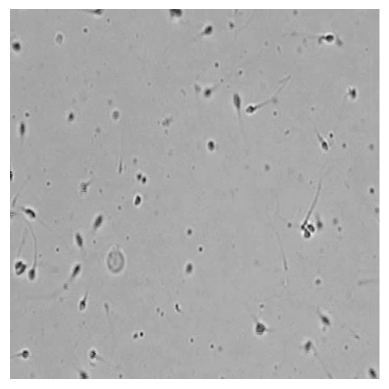

In [8]:
# Menampilkan gambar grayscale
plt.imshow(frames[0], cmap='gray')  # Menggunakan colormap 'gray' untuk menampilkan gambar grayscale
plt.axis('off')  # Menonaktifkan sumbu (opsional)
plt.show()  # Menampilkan gambar

**Menggunakan Trackpy.locate untuk menandai objek sperma**

/usr/local/lib/python3.12/dist-packages/trackpy/feature.py:313: DeprecationWarning: The filter_after argument has been deprecated: it is always on, unless minmass = None and maxsize = None.
  warnings.warn("The filter_after argument has been deprecated: it is "
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


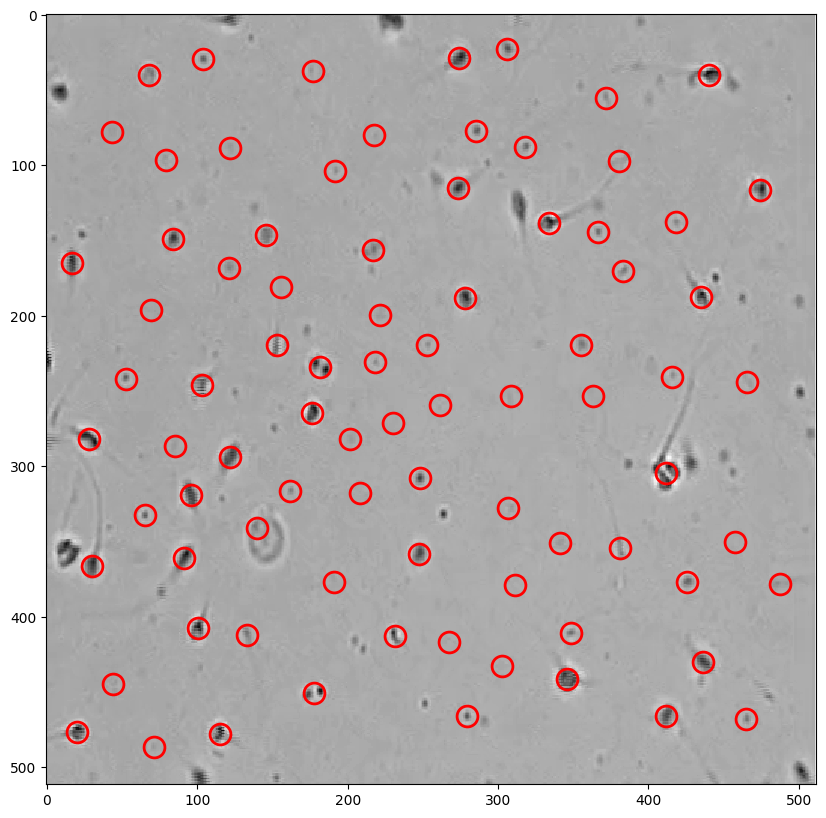

In [9]:
#tp.locate untuk menandai objek
f = tp.locate(frames[0], diameter=21, minmass=100, maxsize=None, separation=30,
              noise_size=1, smoothing_size=None, threshold=None, invert=True,
              topn=None, preprocess=True, max_iterations=10,
              filter_before=None, filter_after=True, characterize=True)

# Deteksi sperma (memberikan anotasi)
plt.figure(figsize=(14, 10))
tp.annotate(f, frames[0])
plt.show()

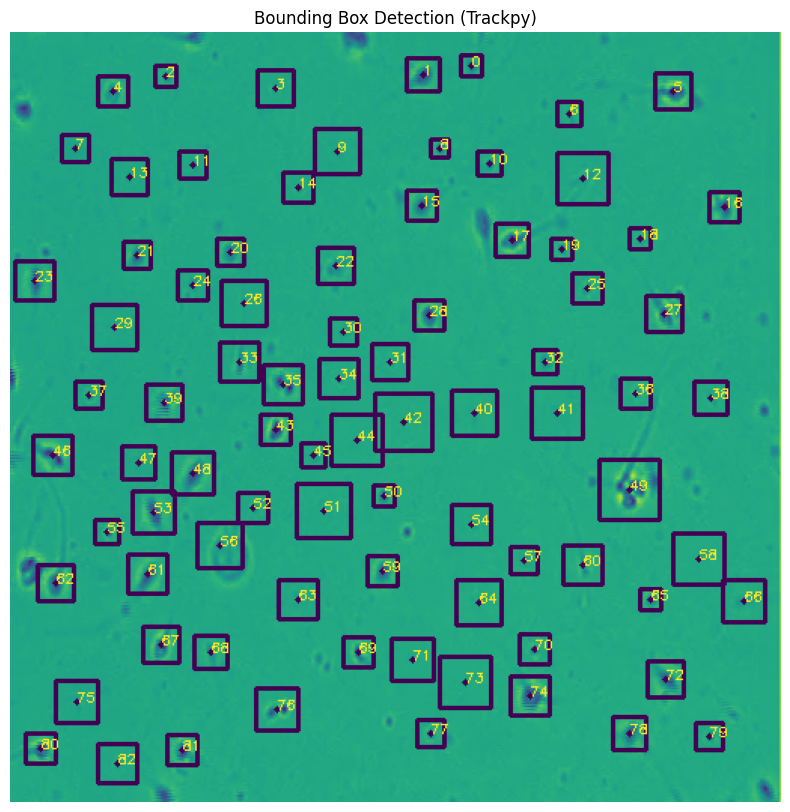

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

frame = frames[0].copy()

# kalau masih PIL → ubah ke numpy (biar bisa pakai cv2)
if not isinstance(frame, np.ndarray):
    frame = np.array(frame)

for _, row in f.iterrows():
    x, y = int(row['x']), int(row['y'])
    size = int(row['size'] * 3)  # scaling biar pas

    x1 = x - size
    y1 = y - size
    x2 = x + size
    y2 = y + size

    cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

for i, row in f.iterrows():
    x, y = int(row['x']), int(row['y'])

    cv2.circle(frame, (x, y), 2, (0, 0, 255), -1)
    cv2.putText(frame, str(i), (x, y),
                cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255,255,0), 1)

plt.figure(figsize=(14,10))
plt.imshow(frame)
plt.title("Bounding Box Detection (Trackpy)")
plt.axis('off')
plt.show()

Frame 2524: 26 features


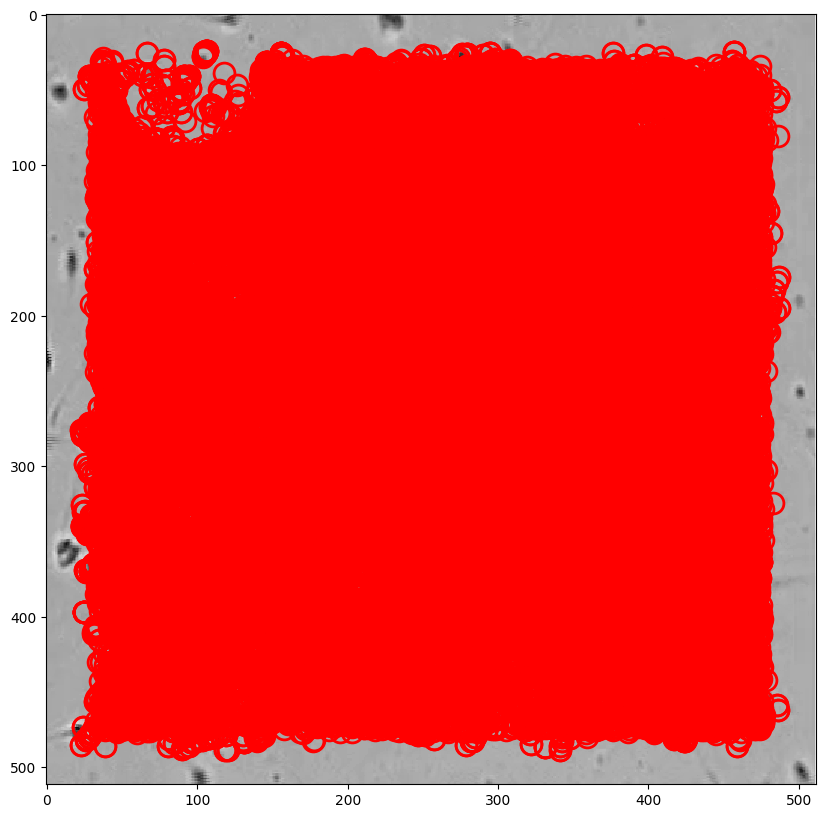

In [11]:
# Untuk menemukan spermatoza di setiap frame, panggil fungsi batch, yang memanggil locate pada setiap frame dan mengumpulkan hasilnya.
# Sebaiknya tetapkan parameter yang sama yang kita gunakan di loacte untuk melacak partikel yang sama untuk semua bingkai.
# Kita dapat mengurangi jumlah bingkai atau hanya melacak dari bingkai tertentu ke bingkai. semua bingkai frames[:] atau cukup frames. 10 bingkai pertama frames[:10], 10 bingkai terakhir frames[-10:], rentang bingkai frames[100:200], setiap bingkai ke-10 frame[::10], daftar bingkai tertentu frames[[100, 107, 113]]

f = tp.batch(frames[:], 21, minmass=500, maxsize=None, separation=50, noise_size=1, smoothing_size
 =None, threshold=None,
invert=True, topn=None, preprocess= True, max_iterations=10, filter_before=None, filter_after=True,
characterize=True, engine='numba')

# Menampilkan anotasi
plt.figure(figsize=(14, 10))
tp.annotate(f, frames[0]);

In [12]:
f

,y,x,mass,size,ecc,signal,raw_mass,ep,frame
0,28.879520,274.206511,4595.105138,3.753617,0.241963,91.164499,-43595.333333,NaN,0
1,39.617633,440.270706,5273.451888,4.277751,0.315186,105.253558,-45327.000000,NaN,0
2,115.107083,273.449032,3703.350583,3.405299,0.150631,88.263810,-45147.000000,NaN,0
3,116.276463,474.375645,3852.114471,3.401744,0.105480,97.794644,-45923.333333,NaN,0
4,138.007194,333.888684,4493.166653,3.974545,0.247497,96.551492,-46622.000000,NaN,0
...,...,...,...,...,...,...,...,...,...
62344,369.043472,131.098862,1692.765277,4.738946,0.505799,33.240922,-37566.000000,NaN,2524
62345,420.577246,243.227120,546.068105,3.132265,0.307941,23.612517,-36759.000000,NaN,2524
62346,466.824554,452.231946,1079.298337,3.495780,0.227288,22.237030,-35837.333333,NaN,2524
62347,472.615079,315.424206,1155.408585,3.577875,0.177555,28.197471,-35928.333333,NaN,2524


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [13]:
t = tp.link_df(f, search_range = 30, memory=20)

Frame 2524: 26 trajectories present.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


/usr/local/lib/python3.12/dist-packages/trackpy/plots.py:361: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  coords = unstacked.bfill().stack().loc[first_frame]
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

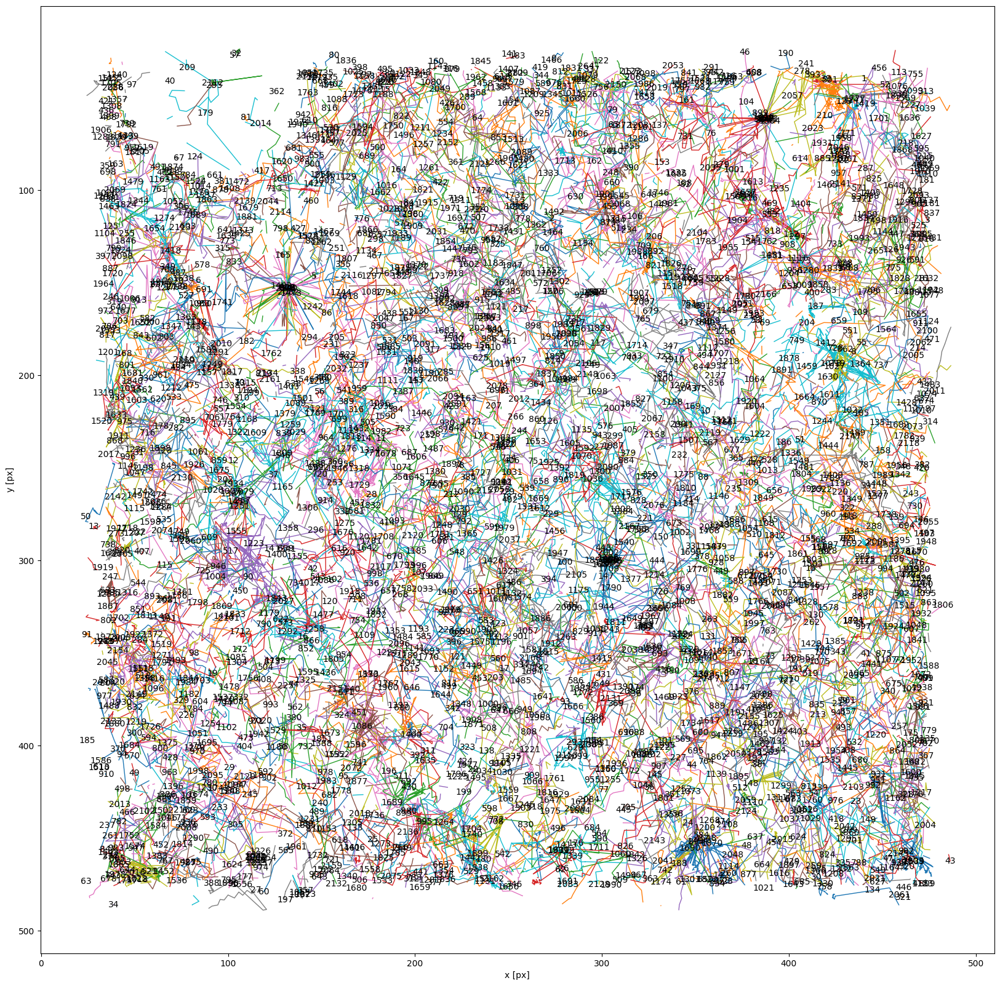

In [14]:
plt.figure(figsize=(20, 20))
tp.plot_traj(t, label=True, superimpose=None);

In [15]:
t['particle'].nunique()

2169

In [16]:
m = 30
t1 = tp.filter_stubs(t, m)

/usr/local/lib/python3.12/dist-packages/trackpy/plots.py:361: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  coords = unstacked.bfill().stack().loc[first_frame]
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


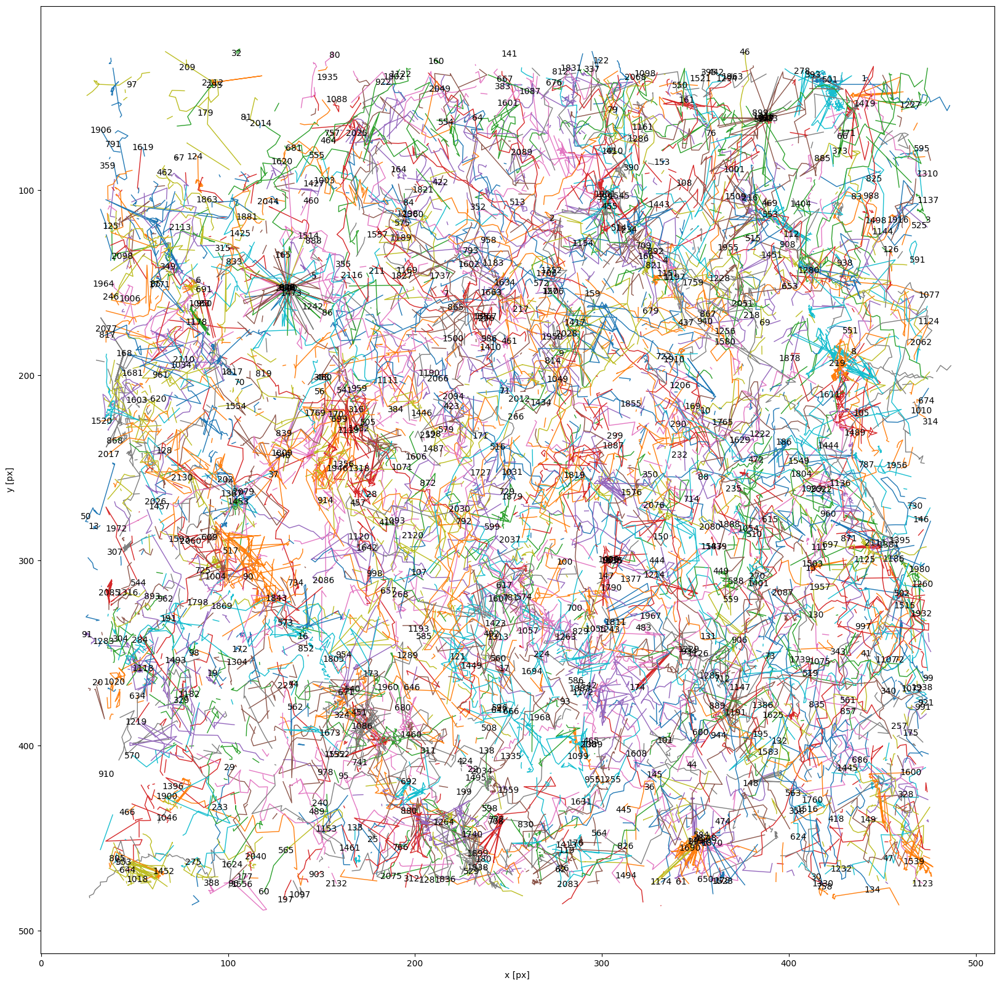

In [17]:
plt.figure(figsize=(20, 20))
tp.plot_traj(t1, label=True, superimpose=None);

In [18]:
print('Total Partikel Awal:', t['particle'].nunique())
print('Total Partikel Setelah di Filter:', t1['particle'].nunique())

Total Partikel Awal: 2169
Total Partikel Setelah di Filter: 628


In [19]:
t1

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
frame,,,,,,,,,,
0,39.617633,440.270706,5273.451888,4.277751,0.315186,105.253558,-45327.000000,NaN,0,1
0,115.107083,273.449032,3703.350583,3.405299,0.150631,88.263810,-45147.000000,NaN,0,2
0,116.276463,474.375645,3852.114471,3.401744,0.105480,97.794644,-45923.333333,NaN,0,3
0,138.007194,333.888684,4493.166653,3.974545,0.247497,96.551492,-46622.000000,NaN,0,4
0,146.277106,146.024190,1918.598322,3.285842,0.159980,38.123336,-47107.000000,NaN,0,5
...,...,...,...,...,...,...,...,...,...,...
2524,284.179048,47.426744,1218.910208,4.060317,0.241006,28.426719,-38185.333333,NaN,2524,2026
2524,312.573417,176.670505,1433.256841,3.675170,0.333398,35.074903,-38255.666667,NaN,2524,2079
2524,331.959140,403.372247,864.034714,6.145080,0.188697,13.067121,-38283.333333,NaN,2524,2087


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [20]:
t1['particle'].nunique()

628

/usr/local/lib/python3.12/dist-packages/trackpy/plots.py:361: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  coords = unstacked.bfill().stack().loc[first_frame]
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


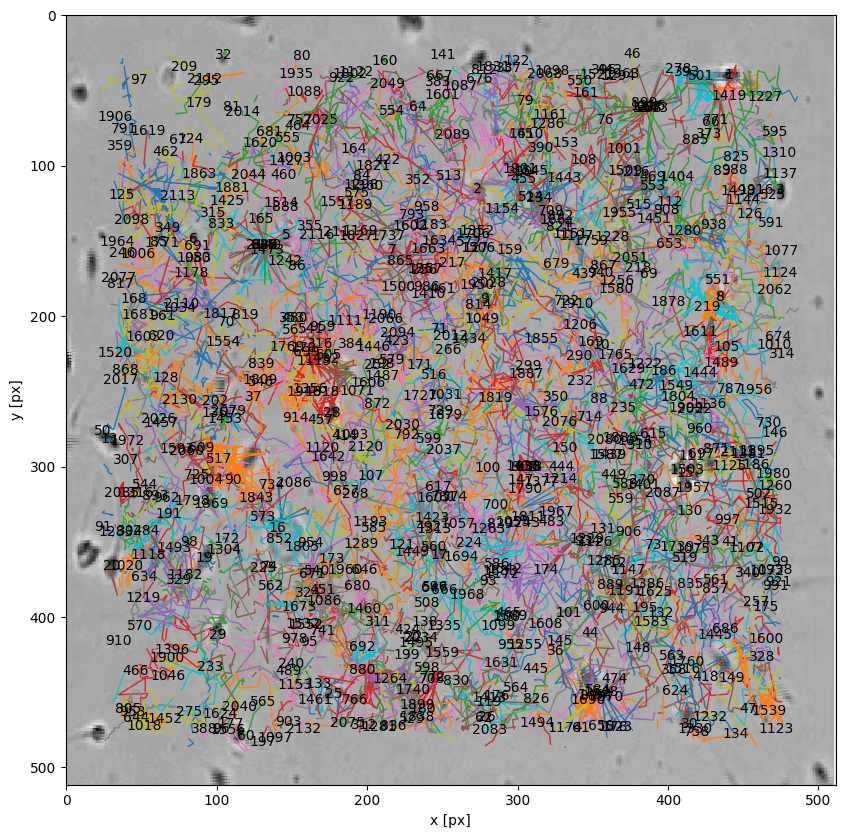

In [21]:
plt.figure(figsize=(10, 10))
tp.plot_traj(t1, label=True, superimpose=frames[0]);

In [22]:
t1.to_excel("t1_dataset.xlsx", index=False)

In [23]:
d = tp.compute_drift(t1, smoothing=30)
t2 = tp.subtract_drift(t1.copy(), d)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [24]:
t2

y           x         mass      size       ecc  \
frame particle                                                            
0     1          39.617633  440.270706  5273.451888  4.277751  0.315186   
      2         115.107083  273.449032  3703.350583  3.405299  0.150631   
      3         116.276463  474.375645  3852.114471  3.401744  0.105480   
      4         138.007194  333.888684  4493.166653  3.974545  0.247497   
      5         146.277106  146.024190  1918.598322  3.285842  0.159980   
...                    ...         ...          ...       ...       ...   
2524  2113      153.943197   59.533517  1554.070397  3.936376  0.317687   
      2116      244.592330  127.481279  1162.286017  3.708006  0.288826   
      2130      343.287169  -17.614327  1165.036990  3.903399  0.354260   
      2132      448.733830    5.674421  1692.765277  4.738946  0.505799   
      2140      231.965636    7.404011  1314.965009  5.444166  0.266158   

                    signal      raw_mass  ep  frame  particle  
frame particle                                                 
0     1         105.253558 -45327.000000 NaN      0         1  
      2          88.263810 -45147.000000 NaN      0         2  
      3          97.794644 -45923.333333 NaN      0         3  
      4          96.551492 -46622.000000 NaN      0         4  
      5          38.123336 -47107.000000 NaN      0         5  
...                    ...           ...  ..    ...       ...  
2524  2113       33.470169 -37205.666667 NaN   2524      2113  
      2116       30.031453 -38591.333333 NaN   2524      2116  
      2130       27.509728 -37907.333333 NaN   2524      2130  
      2132       33.240922 -37566.000000 NaN   2524      2132  
      2140       13.296369 -36270.666667 NaN   2524      2140  

[47631 rows x 10 columns]

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [25]:
t2['particle'].nunique()

628

In [26]:
t1

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
frame_index,,,,,,,,,,
0,39.617633,440.270706,5273.451888,4.277751,0.315186,105.253558,-45327.000000,NaN,0,1
0,115.107083,273.449032,3703.350583,3.405299,0.150631,88.263810,-45147.000000,NaN,0,2
0,116.276463,474.375645,3852.114471,3.401744,0.105480,97.794644,-45923.333333,NaN,0,3
0,138.007194,333.888684,4493.166653,3.974545,0.247497,96.551492,-46622.000000,NaN,0,4
0,146.277106,146.024190,1918.598322,3.285842,0.159980,38.123336,-47107.000000,NaN,0,5
...,...,...,...,...,...,...,...,...,...,...
2524,284.179048,47.426744,1218.910208,4.060317,0.241006,28.426719,-38185.333333,NaN,2524,2026
2524,312.573417,176.670505,1433.256841,3.675170,0.333398,35.074903,-38255.666667,NaN,2524,2079
2524,331.959140,403.372247,864.034714,6.145080,0.188697,13.067121,-38283.333333,NaN,2524,2087


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [27]:
t2.to_excel("t2_dataset.xlsx", index=False)

/usr/local/lib/python3.12/dist-packages/trackpy/plots.py:361: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  coords = unstacked.bfill().stack().loc[first_frame]
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


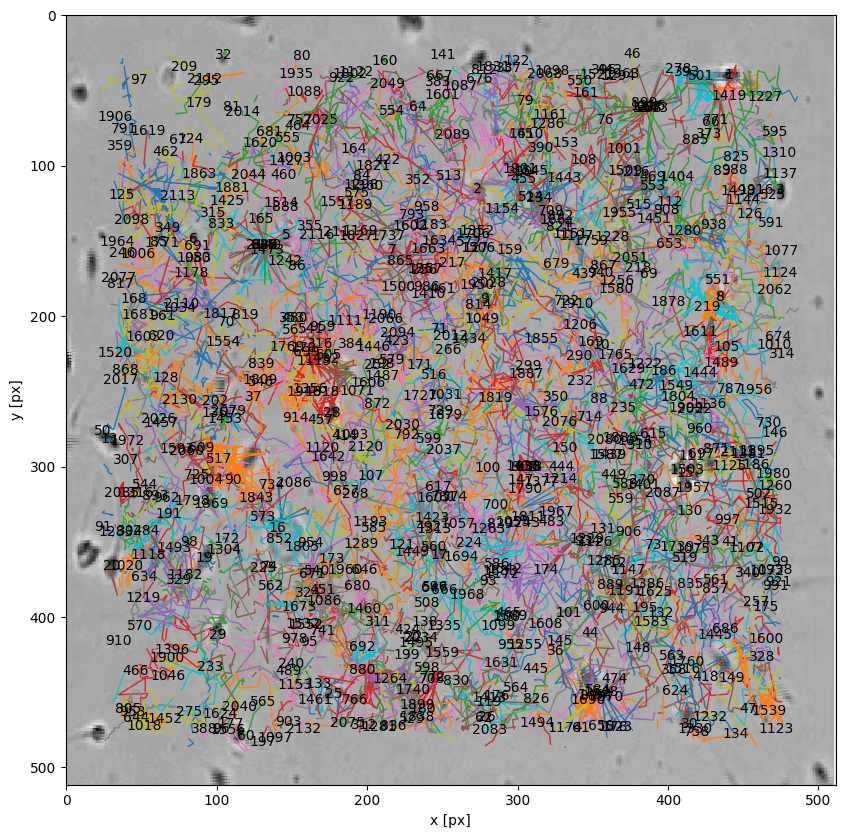

In [28]:
plt.figure(figsize=(10, 10))
tp.plot_traj(t1, label=True, superimpose=frames[0]);

In [29]:
data = pd.DataFrame()
Fps = 30 # FPS saat video direkam
for item in set(t2.particle):
    sub = t2[t2.particle==item]
    dx = np.diff(sub.x)/1.  # perubahan koordinat x
    dy = np.diff(sub.y)/1.  # perubahaan koordinat y
    dt = np.diff(sub.frame)/Fps   # selisih waktu
    v = ((np.sqrt(dy**2 + dx**2)))/dt   # kecepatan
    for x, y, dx, dy, v, dt, frame in zip(sub.x[:-1], sub.y[:-1], abs(dx), abs(dy), v, dt,sub.frame[:-1],):
        # Membuat DataFrame baru
        new_row = pd.DataFrame([{'dx': dx,
                             'dy': dy,
                             'x': x,
                             'y': y,
                             'frame': frame,
                             'particle': item,
                             'dt' : dt,
                             'v' : v,
                            }])
        # Menggabungkan DataFrame 'new row' dan 'data'
        data = pd.concat([data, new_row], ignore_index=True)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [30]:
data

,dx,dy,x,y,frame,particle,dt,v
0,0.441463,0.271141,440.270706,39.617633,0,1,0.033333,15.542417
1,0.603593,0.127854,440.712169,39.346492,1,1,0.033333,18.509582
2,1.812939,3.341154,440.108575,39.474346,2,1,0.033333,114.039706
3,0.089274,0.105224,441.921514,42.815500,3,1,0.033333,4.139765
4,3.405453,1.705869,441.832241,42.710277,4,1,0.033333,114.264572
...,...,...,...,...,...,...,...,...
46998,0.411129,10.430202,139.039852,331.987599,2515,2044,0.033333,313.149046
46999,5.162856,2.276638,139.450981,342.417801,2516,2044,0.033333,169.275955
47000,5.656842,8.151331,144.613837,344.694439,2517,2044,0.033333,297.656926
47001,5.267476,1.645608,138.956995,352.845769,2518,2044,0.033333,165.556313


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [31]:
data['particle'].nunique()

628

In [32]:
data.to_excel("data.xlsx", index=True)

In [33]:
mydict = {}
for p in np.unique(data.particle):
    d = {}
    d['v'] = data.v[data.particle == p]
    d['frame'] = data.frame[data.particle == p]
    d['x'] = data.x[data.particle == p]
    d['y'] = data.y[data.particle == p]
    d['dx'] = data.dx[data.particle == p]
    d['dy'] = data.dy[data.particle == p]
    d['dt'] = data.dt[data.particle == p]
    mydict[p] = d

/usr/local/lib/python3.12/dist-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/usr/local/lib/python3.12/dist-packages/matplotlib/_fontconfig_pattern.py:89: PyparsingDeprecationWarning: 'resetCache' deprecated - use 'reset_cache'
  parser.resetCache()
/usr/local/lib/python3.12/dist-packages/matplotlib/_mathtext.py:2010: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  p.space          = oneOf(self._space_widths)("space")
/usr/local/lib/python3.12/dist-packages/matplotlib/_mathtext.py:2020: PyparsingDeprecationWarning: 'leaveWhitespace' deprecated - use 'leave_whitespace'
  )("sym").leaveWhitespace()
/usr/local/lib/python3.12/dist-packages/matplotlib/_mathtext.py:1984: PyparsingDeprecationWarning: 'setName' deprecated - use 'set_name'
  val.setName(key)
/usr/local/lib/python3.12/dist-packages/matplotlib/_mathtext.py:1987: PyparsingDeprecationWarning: 'setParseA

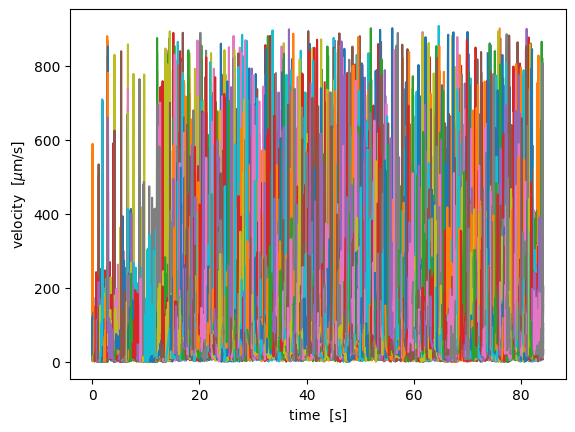

In [34]:
for p in mydict.keys():
    v_p = mydict[p]['v']
    frame_p = mydict[p]['frame']
    t_p = frame_p/Fps
    dt = mydict[p]['dt']
    plt.plot(t_p, v_p)

plt.xlabel('time  [s]')
plt.ylabel(r'velocity  [$\mu$m/s]')
plt.show()

/tmp/ipykernel_64321/2149474281.py:7: DeprecationWarning: Please import `uniform_filter1d` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  v_p_filtered = sp.ndimage.filters.uniform_filter1d(v_p, size = 20)


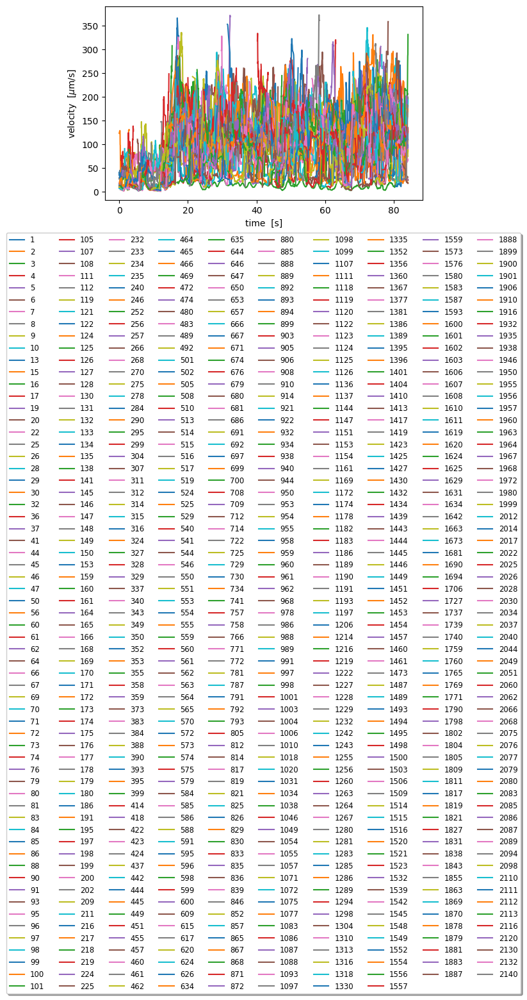

In [35]:
mean_v = []
for p in mydict.keys():
    v_p = mydict[p]['v']
    frame_p = mydict[p]['frame']
    t_p = frame_p/Fps
    #penghalusan data dengan uniform filter sebesar 20 frame
    v_p_filtered = sp.ndimage.filters.uniform_filter1d(v_p, size = 20)
    mean_v.append(np.mean(v_p_filtered)) #tambahkan setiap mean velocity ke mean_v
    plt.plot(t_p, v_p_filtered, label=p)

plt.legend(loc='upper center',
           bbox_to_anchor=(0.5, -0.15),
           fancybox=True,
           shadow=True,
           ncol=10,
           fontsize='small')
plt.subplots_adjust(bottom=0.25)
plt.xlabel('time  [s]')
plt.ylabel(r'velocity  [$\mu$m/s]')
plt.show()

Nilai  linearitas  sperma  didapat  dengan  cara membagi  kecepatan  kepala  sperma  pada  garis  lurus dari titik awal hingga akhir deteksi (Velocity Straight Line) dengan kecepatan kepala sperma pada lintasan berliku  yang  terlihat  secara  2  dimensi  yang  nampak pada mikroskop (Velocity Curvilinear Line) (WHO)


In [36]:
FPS = 30

def calculate_casa_features(data):
    results = []

    for p in np.unique(data['particle']):
        sub = data[data['particle'] == p].sort_values('frame')

        if len(sub) < 2:
            continue

        x = sub['x'].values
        y = sub['y'].values

        # Perubahan posisi
        dx = np.diff(x)
        dy = np.diff(y)

        # Jarak tiap langkah
        step_distances = np.sqrt(dx**2 + dy**2)

        # Waktu antar frame
        dt = 1 / FPS

        # Velocity tiap langkah
        velocities = step_distances / dt

        # Mean Velocity (fitur lama)
        mean_velocity = np.mean(velocities)

        # Total lintasan
        path_length = np.sum(step_distances)

        # Jarak lurus awal-akhir
        straight_distance = np.sqrt(
            (x[-1] - x[0])**2 +
            (y[-1] - y[0])**2
        )

        # Waktu total
        total_time = (
            sub['frame'].iloc[-1]
            - sub['frame'].iloc[0]
        ) / FPS

        if total_time == 0:
            continue

        # CASA Features
        VCL = path_length / total_time
        VSL = straight_distance / total_time
        LIN = VSL / VCL if VCL > 0 else 0

        results.append([
            p,
            mean_velocity,
            VCL,
            VSL,
            LIN
        ])

    return pd.DataFrame(
        results,
        columns=[
            'particle',
            'mean_velocity',
            'VCL',
            'VSL',
            'LIN'
        ]
    )

In [37]:
classification_data = calculate_casa_features(data)

classification_data.head()

,particle,mean_velocity,VCL,VSL,LIN
0,1,45.005651,45.005651,25.827144,0.573864
1,2,26.347268,24.984478,6.354823,0.254351
2,3,12.283703,12.075505,5.185670,0.429437
3,4,7.703178,7.703178,3.472293,0.450761
4,5,14.039597,14.039597,6.483445,0.461797


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [38]:
classification_data['label'] = (
    (classification_data['VSL'] >= 25) &
    (classification_data['LIN'] >= 0.5)
).astype(int)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [39]:
classification_data

,particle,mean_velocity,VCL,VSL,LIN,label
0,1,45.005651,45.005651,25.827144,0.573864,1
1,2,26.347268,24.984478,6.354823,0.254351,0
2,3,12.283703,12.075505,5.185670,0.429437,0
3,4,7.703178,7.703178,3.472293,0.450761,0
4,5,14.039597,14.039597,6.483445,0.461797,0
...,...,...,...,...,...,...
623,2116,165.103534,114.115678,23.437694,0.205385,0
624,2120,215.947750,109.803941,44.728759,0.407351,0
625,2130,54.446921,34.162774,3.720483,0.108905,0
626,2132,89.595405,80.811541,77.659904,0.961000,1


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [40]:
classification_data['label'].value_counts()

,count
label,
0,561
1,67


In [41]:
classification_data['VCL'].describe()

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,VCL
count,628.000000
mean,83.525088
std,40.257557
min,4.284006
25%,56.179463
50%,85.343160
75%,110.418078
max,236.273436


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


<Axes: xlabel='VCL', ylabel='Count'>

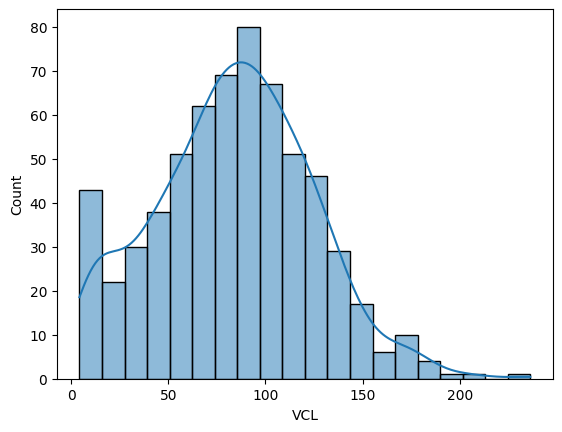

In [42]:
import seaborn as sns
sns.histplot(
    classification_data['VCL'],
    bins=20,
    kde=True
)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


<Axes: xlabel='LIN', ylabel='Count'>

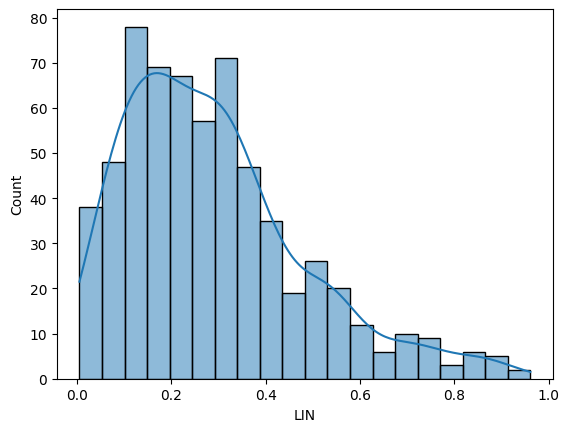

In [43]:
sns.histplot(
    classification_data['LIN'],
    bins=20,
    kde=True
)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


<Axes: xlabel='label', ylabel='VSL'>

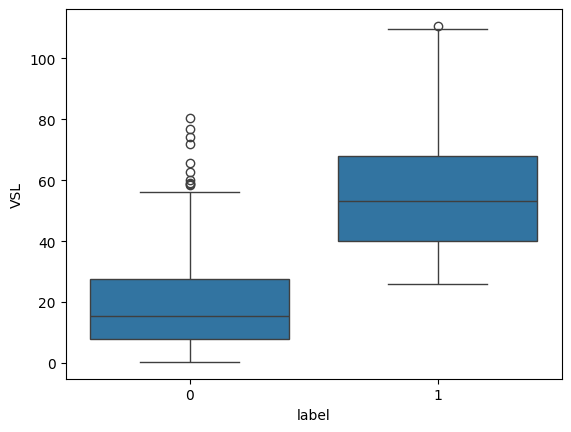

In [44]:
sns.boxplot(
    data=classification_data,
    x='label',
    y='VSL'
)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


<Axes: xlabel='label', ylabel='LIN'>

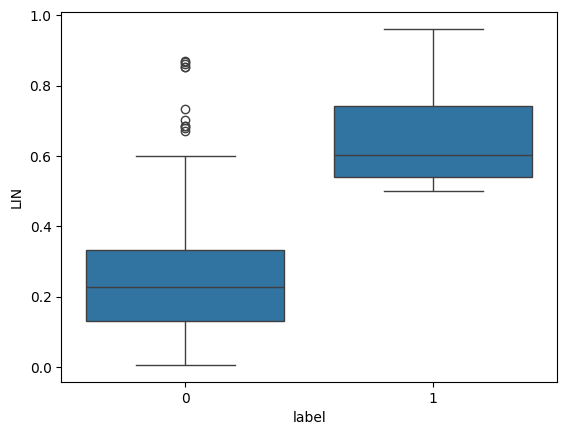

In [45]:
sns.boxplot(
    data=classification_data,
    x='label',
    y='LIN'
)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


<Axes: xlabel='mean_velocity', ylabel='LIN'>

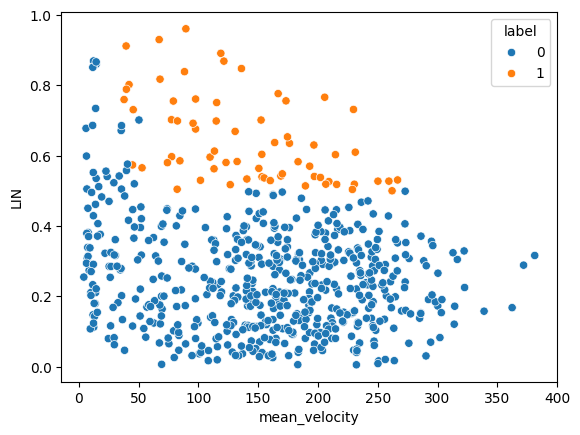

In [46]:
sns.scatterplot(
    data=classification_data,
    x='mean_velocity',
    y='LIN',
    hue='label'
)

In [47]:
classification_data

,particle,mean_velocity,VCL,VSL,LIN,label
0,1,45.005651,45.005651,25.827144,0.573864,1
1,2,26.347268,24.984478,6.354823,0.254351,0
2,3,12.283703,12.075505,5.185670,0.429437,0
3,4,7.703178,7.703178,3.472293,0.450761,0
4,5,14.039597,14.039597,6.483445,0.461797,0
...,...,...,...,...,...,...
623,2116,165.103534,114.115678,23.437694,0.205385,0
624,2120,215.947750,109.803941,44.728759,0.407351,0
625,2130,54.446921,34.162774,3.720483,0.108905,0
626,2132,89.595405,80.811541,77.659904,0.961000,1


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [48]:
print(data.shape)

print(data.head())

print(classification_data.shape)

print(classification_data['label'].value_counts())

print(data.groupby('particle').size().describe())

print(data.columns.tolist())

(47003, 8)
         dx        dy           x          y  frame  particle        dt  \
0  0.441463  0.271141  440.270706  39.617633      0         1  0.033333   
1  0.603593  0.127854  440.712169  39.346492      1         1  0.033333   
2  1.812939  3.341154  440.108575  39.474346      2         1  0.033333   
3  0.089274  0.105224  441.921514  42.815500      3         1  0.033333   
4  3.405453  1.705869  441.832241  42.710277      4         1  0.033333   

            v  
0   15.542417  
1   18.509582  
2  114.039706  
3    4.139765  
4  114.264572  
(628, 6)
label
0    561
1     67
Name: count, dtype: int64
count     628.000000
mean       74.845541
std        91.109203
min        29.000000
25%        38.750000
50%        54.500000
75%        85.000000
max      1921.000000
dtype: float64
['dx', 'dy', 'x', 'y', 'frame', 'particle', 'dt', 'v']


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [49]:
trajectory_data = data.merge(
    classification_data[['particle','label']],
    on='particle',
    how='inner'
)

trajectory_data.head()

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,dx,dy,x,y,frame,particle,dt,v,label
0,0.441463,0.271141,440.270706,39.617633,0,1,0.033333,15.542417,1
1,0.603593,0.127854,440.712169,39.346492,1,1,0.033333,18.509582,1
2,1.812939,3.341154,440.108575,39.474346,2,1,0.033333,114.039706,1
3,0.089274,0.105224,441.921514,42.815500,3,1,0.033333,4.139765,1
4,3.405453,1.705869,441.832241,42.710277,4,1,0.033333,114.264572,1


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [50]:
from sklearn.preprocessing import StandardScaler

features = ['x','y','dx','dy','v']

scaler = StandardScaler()

trajectory_data[features] = scaler.fit_transform(
    trajectory_data[features]
)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [51]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np

feature_cols = ['x','y','dx','dy','v']

X = []
y = []

particles = trajectory_data['particle'].unique()

for p in particles:

    sub = trajectory_data[
        trajectory_data['particle']==p
    ].sort_values('frame')

    seq = sub[feature_cols].values

    label = sub['label'].iloc[0]

    X.append(seq)

    y.append(label)

y = np.array(y)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [52]:
max_len = 200

X_pad = pad_sequences(
    X,
    maxlen=max_len,
    padding='post',
    truncating='post',
    dtype='float32'
)

print(X_pad.shape)

(628, 200, 5)


In [53]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_pad,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [54]:
from sklearn.utils.class_weight import compute_class_weight

classes = np.unique(y_train)

weights = compute_class_weight(
    class_weight='balanced',
    classes=classes,
    y=y_train
)

class_weights = {
    0:weights[0],
    1:weights[1]
}

print(class_weights)

{0: np.float64(0.5602678571428571), 1: np.float64(4.648148148148148)}


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [55]:
import tensorflow as tf

from tensorflow.keras.layers import (
    Input,
    Conv1D,
    MaxPooling1D,
    Bidirectional,
    LSTM,
    Dense,
    Dropout,
    GlobalAveragePooling1D,
    LayerNormalization,
    MultiHeadAttention
)

from tensorflow.keras.models import Model

In [56]:
input_layer = Input(
    shape=(max_len,5)
)

x = Conv1D(
    filters=64,
    kernel_size=3,
    activation='relu',
    padding='same'
)(input_layer)

x = MaxPooling1D(
    pool_size=2
)(x)

x = Bidirectional(
    LSTM(
        64,
        return_sequences=True
    )
)(x)

attn = MultiHeadAttention(
    num_heads=4,
    key_dim=32
)(
    x,
    x
)

x = LayerNormalization()(
    x + attn
)

x = GlobalAveragePooling1D()(x)

x = Dense(
    128,
    activation='relu'
)(x)

x = Dropout(0.3)(x)

x = Dense(
    64,
    activation='relu'
)(x)

output = Dense(
    1,
    activation='sigmoid'
)(x)

model = Model(
    input_layer,
    output
)

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 200, 5)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 200, 64)   │      1,024 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d       │ (None, 100, 64)   │          0 │ conv1d[0][0]      │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional       │ (None, 100, 128)  │     66,048 │ max_pooling1d[0]… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 100, 128)  │     66,048 │ bidirectional[0]… │
│ (MultiHeadAttentio… │                   │            │ bidirectional[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 100, 128)  │          0 │ bidirectional[0]… │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 100, 128)  │        256 │ add[0][0]         │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │     16,512 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 128)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 64)        │      8,256 │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 1)         │         65 │ dense_1[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 158,209 (618.00 KB)

 Trainable params: 158,209 (618.00 KB)

 Non-trainable params: 0 (0.00 B)

In [57]:
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=[
        'accuracy',
        tf.keras.metrics.AUC(name='auc')
    ]
)

In [58]:
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5
)

history = model.fit(
    X_train,
    y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=16,
    class_weight=class_weights,
    callbacks=[
        early_stop,
        reduce_lr
    ]
)

Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/core.py:171: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  return np.array(x)


26/26 ━━━━━━━━━━━━━━━━━━━━ 18s 298ms/step - accuracy: 0.6883 - auc: 0.5881 - loss: 0.6561 - val_accuracy: 0.7525 - val_auc: 0.7291 - val_loss: 0.5732 - learning_rate: 0.0010
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 7s 283ms/step - accuracy: 0.6658 - auc: 0.6574 - loss: 0.6402 - val_accuracy: 0.6040 - val_auc: 0.7547 - val_loss: 0.5962 - learning_rate: 0.0010
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 7s 264ms/step - accuracy: 0.6384 - auc: 0.6764 - loss: 0.6184 - val_accuracy: 0.6139 - val_auc: 0.7628 - val_loss: 0.5964 - learning_rate: 0.0010
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 7s 278ms/step - accuracy: 0.6334 - auc: 0.6958 - loss: 0.5992 - val_accuracy: 0.4851 - val_auc: 0.8004 - val_loss: 0.7152 - learning_rate: 0.0010
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 268ms/step - accuracy: 0.6160 - auc: 0.6852 - loss: 0.6063 - val_accuracy: 0.3564 - val_auc: 0.4628 - val_loss: 0.8009 - learning_rate: 0.0010
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 7s 276ms/step - accuracy: 0.6434 - auc: 0.7407

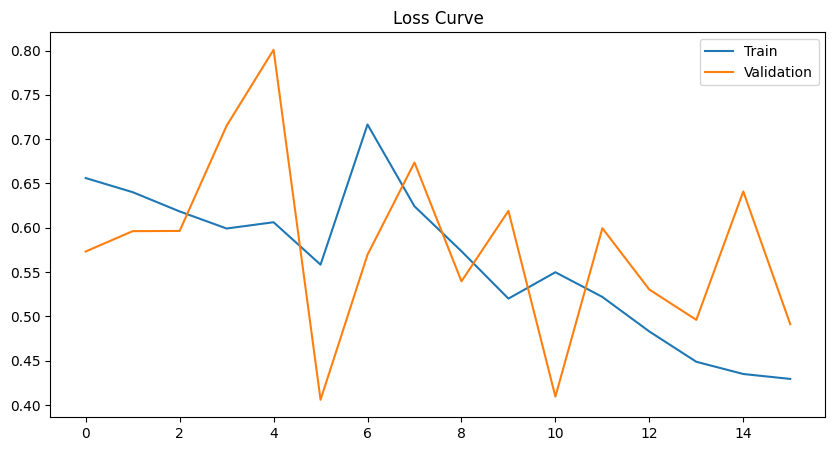

In [59]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))

plt.plot(
    history.history['loss'],
    label='Train'
)

plt.plot(
    history.history['val_loss'],
    label='Validation'
)

plt.legend()
plt.title("Loss Curve")
plt.show()

In [60]:
y_prob = model.predict(X_test)

y_pred = (
    y_prob > 0.5
).astype(int)

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 395ms/step


In [61]:
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_auc_score
)

y_prob = model.predict(X_test)

y_pred = (
    y_prob > 0.5
).astype(int)

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step


In [62]:
print(
    classification_report(
        y_test,
        y_pred
    )
)

              precision    recall  f1-score   support

           0       0.90      0.87      0.88       113
           1       0.12      0.15      0.13        13

    accuracy                           0.79       126
   macro avg       0.51      0.51      0.51       126
weighted avg       0.82      0.79      0.81       126



/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


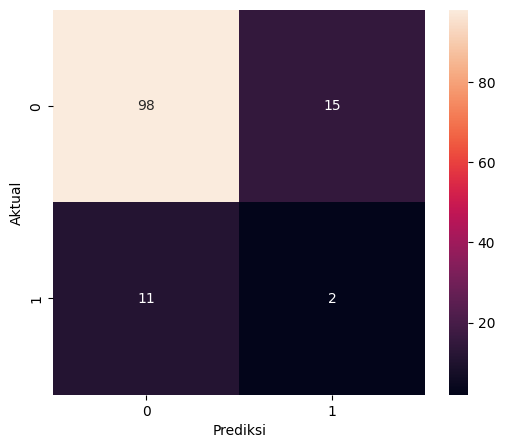

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(
    y_test,
    y_pred
)

plt.figure(figsize=(6,5))

sns.heatmap(
    cm,
    annot=True,
    fmt='d'
)

plt.xlabel("Prediksi")
plt.ylabel("Aktual")

plt.show()

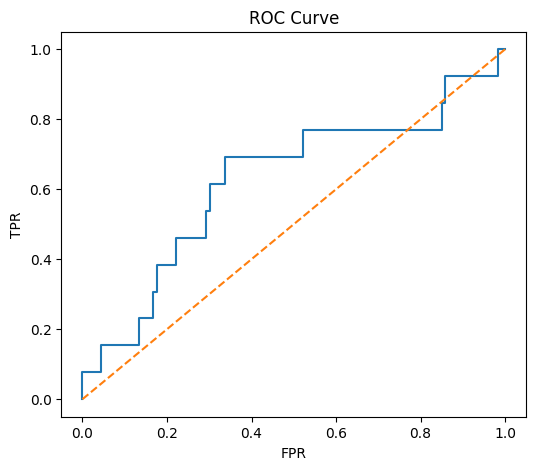

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [64]:
from sklearn.metrics import (
    roc_curve
)

fpr,tpr,_ = roc_curve(
    y_test,
    y_prob
)

plt.figure(figsize=(6,5))

plt.plot(
    fpr,
    tpr
)

plt.plot(
    [0,1],
    [0,1],
    '--'
)

plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC Curve")

plt.show()

In [65]:
normal_particle = classification_data[
    classification_data.label==1
].particle.iloc[0]

abnormal_particle = classification_data[
    classification_data.label==0
].particle.iloc[0]

In [66]:
import numpy as np

MAX_LEN = 100

X_pad = []

for seq in X:

    # truncate
    if len(seq) > MAX_LEN:
        seq = seq[:MAX_LEN]

    # padding
    if len(seq) < MAX_LEN:

        pad = np.zeros(
            (
                MAX_LEN - len(seq),
                seq.shape[1]
            )
        )

        seq = np.vstack(
            [seq, pad]
        )

    X_pad.append(seq)

X = np.array(X_pad)

print(X.shape)

(628, 100, 5)


In [67]:
lengths = [len(seq) for seq in X]

print(min(lengths))
print(max(lengths))
print(np.median(lengths))

100
100
100.0


In [68]:
X_flat = X.reshape(
    X.shape[0],
    -1
)

print(X_flat.shape)

(628, 500)


In [69]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(
    random_state=42,
    k_neighbors=5
)

X_bal, y_bal = smote.fit_resample(
    X_flat,
    y
)

print(pd.Series(y_bal).value_counts())

1    561
0    561
Name: count, dtype: int64


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [70]:
X_bal = X_bal.reshape(
    X_bal.shape[0],
    100,
    5
)

print(X_bal.shape)

(1122, 100, 5)


In [71]:
from sklearn.model_selection import train_test_split

# Split utama
X_train, X_test, y_train, y_test = train_test_split(
    X_bal,
    y_bal,
    test_size=0.2,
    stratify=y_bal,
    random_state=42
)

print("Train:", X_train.shape)
print("Test :", X_test.shape)

# Split lagi untuk PPO
X_train_rl, X_val_rl, y_train_rl, y_val_rl = train_test_split(
    X_train,
    y_train,
    test_size=0.2,
    stratify=y_train,
    random_state=42
)

print("RL Train:", X_train_rl.shape)
print("RL Val  :", X_val_rl.shape)

Train: (897, 100, 5)
Test : (225, 100, 5)
RL Train: (717, 100, 5)
RL Val  : (180, 100, 5)


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [72]:
import tensorflow as tf

from tensorflow.keras.layers import (
    Input,
    Conv1D,
    BatchNormalization,
    MaxPooling1D,
    Bidirectional,
    LSTM,
    MultiHeadAttention,
    Add,
    LayerNormalization,
    GlobalAveragePooling1D,
    Dense,
    Dropout
)

from tensorflow.keras.models import Model

In [73]:
def build_model(
    filters,
    lstm_units,
    dropout_rate,
    lr,
    num_heads
):

    inputs = Input(shape=(100,5))

    x = Conv1D(
        filters=filters,
        kernel_size=3,
        activation='relu',
        padding='same'
    )(inputs)

    x = BatchNormalization()(x)

    x = MaxPooling1D(2)(x)

    x = Bidirectional(
        LSTM(
            lstm_units,
            return_sequences=True
        )
    )(x)

    attn = MultiHeadAttention(
        num_heads=num_heads,
        key_dim=32
    )(x,x)

    x = Add()([x,attn])

    x = LayerNormalization()(x)

    x = GlobalAveragePooling1D()(x)

    x = Dense(
        128,
        activation='relu'
    )(x)

    x = Dropout(dropout_rate)(x)

    outputs = Dense(
        1,
        activation='sigmoid'
    )(x)

    model = Model(
        inputs,
        outputs
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            learning_rate=lr
        ),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )

    return model

In [74]:
reward_history = []
param_history = []

class HyperparameterEnv(gym.Env):

    def __init__(self):

        super().__init__()

        self.action_space = spaces.Box(
            low=np.zeros(5),
            high=np.ones(5),
            shape=(5,),
            dtype=np.float32
        )

        self.observation_space = spaces.Box(
            low=0,
            high=1,
            shape=(5,),
            dtype=np.float32
        )

        self.state = np.random.rand(5).astype(np.float32)

    def reset(
        self,
        seed=None,
        options=None
    ):

        super().reset(seed=seed)

        self.state = np.random.rand(
            5
        ).astype(np.float32)

        return self.state, {}

    def decode_action(
        self,
        action
    ):

        filters = [32,64][
            min(
                int(action[0]*2),
                1
            )
        ]

        lstm_units = [32,64][
            min(
                int(action[1]*2),
                1
            )
        ]

        dropout = [0.2,0.3][
            min(
                int(action[2]*2),
                1
            )
        ]

        lr = [1e-3,1e-4][
            min(
                int(action[3]*2),
                1
            )
        ]

        heads = [2,4][
            min(
                int(action[4]*2),
                1
            )
        ]

        return (
            filters,
            lstm_units,
            dropout,
            lr,
            heads
        )

    def step(
        self,
        action
    ):

        (
            filters,
            lstm_units,
            dropout,
            lr,
            heads
        ) = self.decode_action(action)

        model = build_model(
            filters,
            lstm_units,
            dropout,
            lr,
            heads
        )

        model.fit(
            X_train_rl,
            y_train_rl,
            epochs=2,
            batch_size=32,
            verbose=0
        )

        y_prob = model.predict(
            X_val_rl,
            verbose=0
        ).flatten()

        y_pred = (
            y_prob > 0.5
        ).astype(int)

        f1 = f1_score(
            y_val_rl,
            y_pred
        )

        auc = roc_auc_score(
            y_val_rl,
            y_prob
        )

        reward = (
            0.5 * f1 +
            0.5 * auc
        )

        reward_history.append(
            reward
        )

        param_history.append({

            "filters": filters,

            "lstm_units": lstm_units,

            "dropout": dropout,

            "learning_rate": lr,

            "heads": heads,

            "f1": f1,

            "auc": auc,

            "reward": reward

        })

        self.state = np.random.rand(
            5
        ).astype(np.float32)

        terminated = True

        truncated = False

        info = {

            "reward": reward,

            "f1": f1,

            "auc": auc

        }

        return (
            self.state,
            reward,
            terminated,
            truncated,
            info
        )

In [77]:
ppo_model = PPO(
    "MlpPolicy",
    env,
    n_steps=16,
    batch_size=8,
    verbose=1
)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


In [78]:
ppo_model.learn(
    total_timesteps=20
)

/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/core.py:171: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  return np.array(x)
/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/core.py:171: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  return np.array(x)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use t

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 1        |
|    ep_rew_mean     | 0.779    |
| time/              |          |
|    fps             | 0        |
|    iterations      | 1        |
|    time_elapsed    | 211      |
|    total_timesteps | 16       |
---------------------------------


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/core.py:171: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  return np.array(x)
/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/core.py:171: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see t

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 1           |
|    ep_rew_mean          | 0.75        |
| time/                   |             |
|    fps                  | 0           |
|    iterations           | 2           |
|    time_elapsed         | 406         |
|    total_timesteps      | 32          |
| train/                  |             |
|    approx_kl            | 0.011499785 |
|    clip_fraction        | 0.025       |
|    clip_range           | 0.2         |
|    entropy_loss         | -7.09       |
|    explained_variance   | -1.33       |
|    learning_rate        | 0.0003      |
|    loss                 | -0.0729     |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.0463     |
|    std                  | 1           |
|    value_loss           | 0.202       |
-----------------------------------------


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [79]:
obs, _ = env.reset()

action, _ = ppo_model.predict(
    obs,
    deterministic=True
)

best_params = env.decode_action(
    action
)

print(best_params)

(32, 32, 0.2, 0.001, 2)


In [81]:
len(param_history)

77

In [82]:
import pandas as pd

ppo_results = pd.DataFrame(param_history)

ppo_results = ppo_results.sort_values(
    by="reward",
    ascending=False
)

ppo_results.head()

,filters,lstm_units,dropout,learning_rate,heads,f1,auc,reward
64,64,32,0.2,0.001,2,0.845361,0.910247,0.877804
54,32,32,0.2,0.001,2,0.840426,0.909506,0.874966
34,64,32,0.2,0.001,2,0.837989,0.905679,0.871834
6,64,32,0.2,0.001,2,0.826531,0.902346,0.864438
53,64,32,0.2,0.001,4,0.830000,0.893951,0.861975


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [87]:
best = ppo_results.iloc[0]

best_filters = int(best["filters"])
best_lstm = int(best["lstm_units"])
best_dropout = float(best["dropout"])
best_heads = int(best["heads"])

print(best)

filters          64.000000
lstm_units       32.000000
dropout           0.200000
learning_rate     0.001000
heads             2.000000
f1                0.845361
auc               0.910247
reward            0.877804
Name: 64, dtype: float64


In [88]:
print(len(reward_history))

77


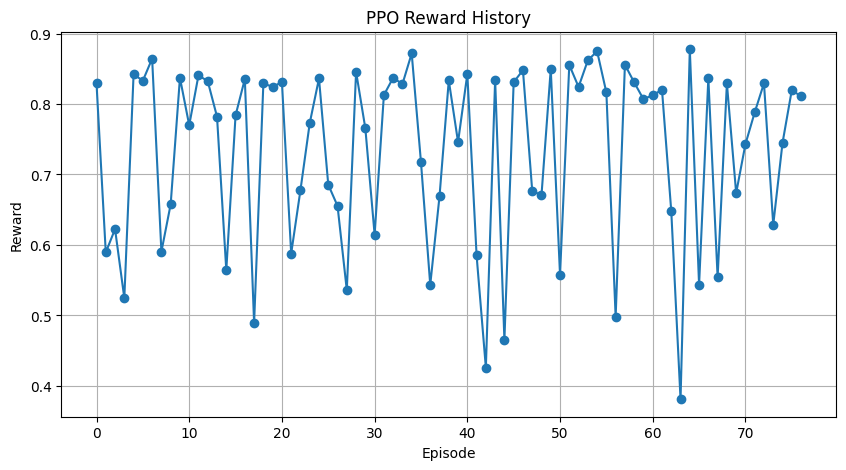

In [89]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))

plt.plot(
    reward_history,
    marker='o'
)

plt.xlabel("Episode")
plt.ylabel("Reward")
plt.title("PPO Reward History")

plt.grid(True)

plt.show()

In [90]:
filters,\
lstm_units,\
dropout,\
lr,\
heads = best_params

model = build_model(
    filters,
    lstm_units,
    dropout,
    lr,
    heads
)

In [91]:
history = model.fit(
    X_train,
    y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=16,
    callbacks=[
        early_stop,
        reduce_lr
    ]
)

Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/core.py:171: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  return np.array(x)


45/45 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - accuracy: 0.6820 - loss: 0.5796 - val_accuracy: 0.6500 - val_loss: 0.6645 - learning_rate: 0.0010
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.7950 - loss: 0.4363 - val_accuracy: 0.8056 - val_loss: 0.4401 - learning_rate: 0.0010
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - accuracy: 0.8536 - loss: 0.3451 - val_accuracy: 0.8056 - val_loss: 0.4516 - learning_rate: 0.0010
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8731 - loss: 0.2951 - val_accuracy: 0.7944 - val_loss: 0.5798 - learning_rate: 0.0010
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9121 - loss: 0.2306 - val_accuracy: 0.7889 - val_loss: 0.6403 - learning_rate: 0.0010
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.9177 - loss: 0.1875 - val_accuracy: 0.8111 - val_loss: 0.6029 - learning_rate: 5.0000e-04
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.9289 - loss: 0.1672 - val_ac

In [92]:
y_prob = model.predict(X_test)

y_pred = (
    y_prob > 0.5
).astype(int)

y_pred = y_pred.flatten()
y_prob = y_prob.flatten()

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step


In [93]:
from sklearn.metrics import classification_report

print(
    classification_report(
        y_test,
        y_pred,
        target_names=[
            "Abnormal",
            "Normal"
        ]
    )
)

              precision    recall  f1-score   support

    Abnormal       0.96      0.96      0.96       113
      Normal       0.96      0.96      0.96       112

    accuracy                           0.96       225
   macro avg       0.96      0.96      0.96       225
weighted avg       0.96      0.96      0.96       225



/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


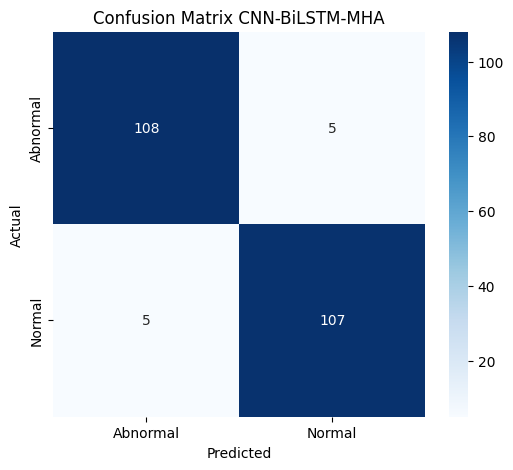

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [94]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(
    y_test,
    y_pred
)

plt.figure(figsize=(6,5))

sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=[
        'Abnormal',
        'Normal'
    ],
    yticklabels=[
        'Abnormal',
        'Normal'
    ]
)

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.title(
    "Confusion Matrix CNN-BiLSTM-MHA"
)

plt.show()

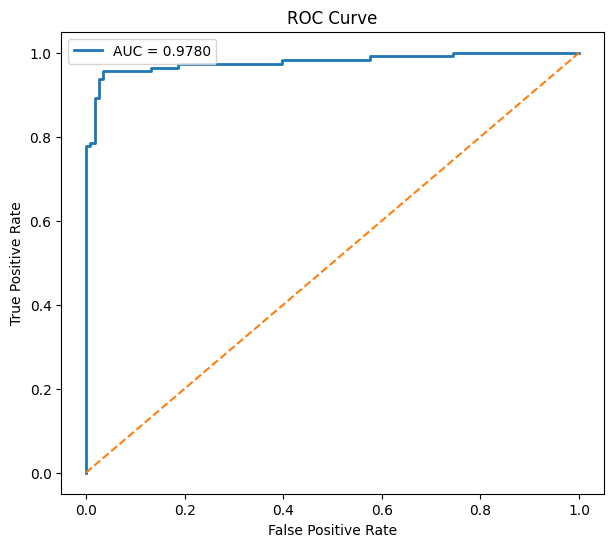

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [95]:
from sklearn.metrics import (
    roc_curve,
    auc
)

fpr, tpr, _ = roc_curve(
    y_test,
    y_prob
)

roc_auc = auc(
    fpr,
    tpr
)

plt.figure(figsize=(7,6))

plt.plot(
    fpr,
    tpr,
    linewidth=2,
    label=f"AUC = {roc_auc:.4f}"
)

plt.plot(
    [0,1],
    [0,1],
    '--'
)

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.title(
    "ROC Curve"
)

plt.legend()

plt.show()

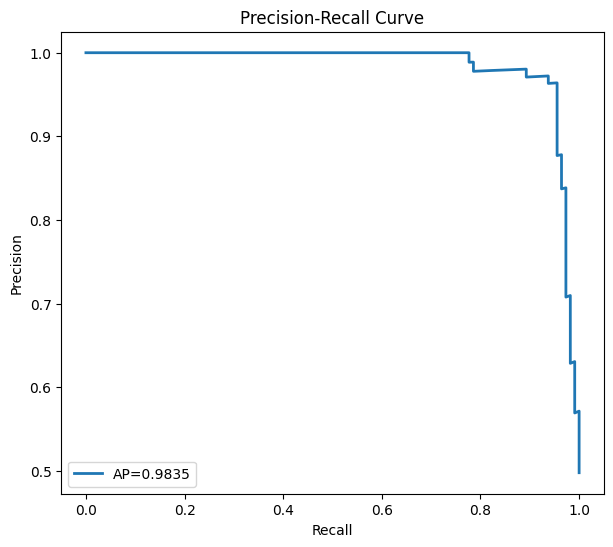

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [96]:
from sklearn.metrics import (
    precision_recall_curve,
    average_precision_score
)

precision,\
recall,\
_ = precision_recall_curve(
    y_test,
    y_prob
)

ap = average_precision_score(
    y_test,
    y_prob
)

plt.figure(figsize=(7,6))

plt.plot(
    recall,
    precision,
    linewidth=2,
    label=f"AP={ap:.4f}"
)

plt.xlabel("Recall")

plt.ylabel("Precision")

plt.title(
    "Precision-Recall Curve"
)

plt.legend()

plt.show()

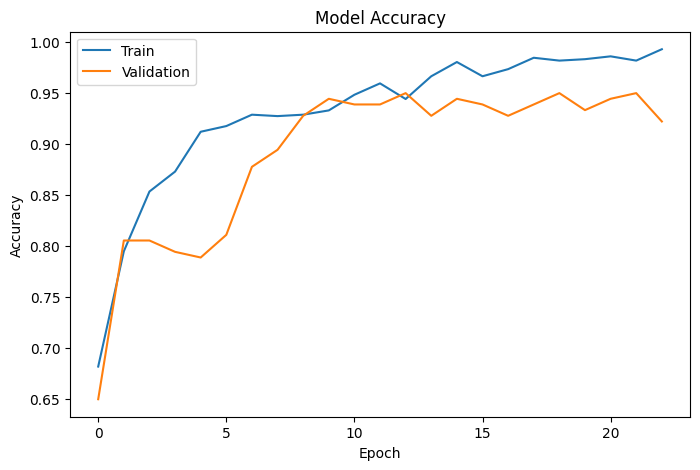

In [97]:
plt.figure(figsize=(8,5))

plt.plot(
    history.history['accuracy'],
    label='Train'
)

plt.plot(
    history.history['val_accuracy'],
    label='Validation'
)

plt.title(
    'Model Accuracy'
)

plt.xlabel('Epoch')

plt.ylabel('Accuracy')

plt.legend()

plt.show()

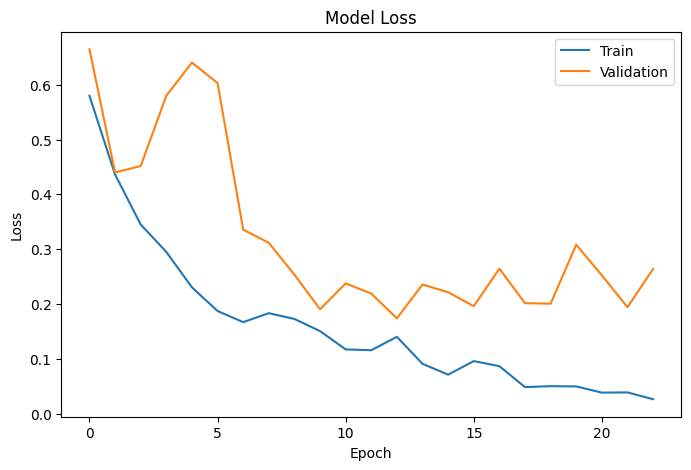

In [98]:
plt.figure(figsize=(8,5))

plt.plot(
    history.history['loss'],
    label='Train'
)

plt.plot(
    history.history['val_loss'],
    label='Validation'
)

plt.title(
    'Model Loss'
)

plt.xlabel('Epoch')

plt.ylabel('Loss')

plt.legend()

plt.show()

In [99]:
test_result = pd.DataFrame({
    'actual': y_test,
    'pred': y_pred,
    'prob': y_prob
})

test_result

,actual,pred,prob
0,1,1,0.719710
1,0,0,0.003134
2,1,1,0.991549
3,0,0,0.002776
4,0,0,0.035571
...,...,...,...
220,1,1,0.919907
221,0,0,0.197336
222,0,0,0.006952
223,1,1,0.988417


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
